<a href="https://colab.research.google.com/github/qyune/cmpt733-tproj/blob/main/task1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Imoprt all packages

In [38]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tables
from dataprep.eda import plot
from sklearn.svm import OneClassSVM
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectKBest, chi2, f_classif, mutual_info_classif
from sklearn.metrics import average_precision_score, roc_auc_score, accuracy_score, f1_score

# Data Preprocessing


**Main Demographic Data**

In [39]:
ME_PATH = './statics.h5'
# Gap time 6 hours for the first 24 hours.
GAP_TIME = 6
# Consider first 24 hours data only.
WINDOW_SIZE = 24

SEED        = 1
ID_COLS     = ['subject_id', 'hadm_id', 'icustay_id']

np.random.seed(SEED)


In [40]:
def clean_age(age):
  if age == 300:
    return 90
  elif age > 300:
    dif = age - 300
    age = 90 + dif
    return age
  elif age == 0:
    return 54
  return age

In [41]:
# Read demographic features 
icu_demo = pd.read_hdf(ME_PATH, 'statics')
icu_demo['age'] = icu_demo['age'].apply(clean_age)
# Filter icu stays that are long than 30 hours
icu_demo = icu_demo[icu_demo.max_hours > WINDOW_SIZE + GAP_TIME]
# Get labels for length of stay
icu_demo['los_3'] = icu_demo['los_icu'] > 3
icu_demo['los_3'] = icu_demo['los_3'].astype(int)
icu_demo['los_7'] = icu_demo['los_icu'] > 7
icu_demo['los_7'] = icu_demo['los_7'].astype(int)
# Remove features based on domain knowledge
icu_demo.drop(columns=['los_icu', 'insurance', 'admittime', 'dischtime', 'discharge_location', 'ethnicity', 
                       'fullcode_first', 'dnr_first', 'fullcode', 'dnr', 'dnr_first_charttime', 'cmo_first', 
                       'cmo_last', 'cmo', 'deathtime', 'intime', 'outtime', 'hospital_expire_flag', 
                       'hospstay_seq', 'max_hours', 'diagnosis_at_admission'], inplace=True)
print(icu_demo.head(5))
print(icu_demo.shape)

                              gender        age admission_type first_careunit  \
subject_id hadm_id icustay_id                                                   
3          145834  211552          M  76.526792      EMERGENCY           MICU   
4          185777  294638          F  47.845047      EMERGENCY           MICU   
6          107064  228232          F  65.942297       ELECTIVE           SICU   
9          150750  220597          M  41.790228      EMERGENCY           MICU   
11         194540  229441          F  50.148295      EMERGENCY           SICU   

                               mort_icu  mort_hosp  readmission_30  los_3  \
subject_id hadm_id icustay_id                                               
3          145834  211552             0          0               0      1   
4          185777  294638             0          0               0      0   
6          107064  228232             0          0               0      1   
9          150750  220597             1        

In [42]:
# read vitals signs data
vitals = pd.read_hdf('lvl2_flat.h5', 'lvl2_flat')

**Height & Weight Data**

In [43]:
# Read height and weight
icu_height_weight = pd.read_csv('./heightweight.csv')
icu_height_weight.set_index(['icustay_id'], inplace=True)
# Create new features based on domain knowledge
icu_height_weight['weight_diff'] = icu_height_weight['weight_max'] - icu_height_weight['weight_min']
icu_height_weight['BMI'] = icu_height_weight['weight_first'] / (icu_height_weight['height_first'] / 100).pow(2)
# Keep useful features
icu_height_weight = icu_height_weight[['weight_first', 'height_first', 'weight_diff', 'BMI']]
print(icu_height_weight)

            weight_first  height_first  weight_diff        BMI
icustay_id                                                    
200001              61.0        170.18          0.0  21.062640
200003              77.0           NaN          2.7        NaN
200006              82.4           NaN          0.0        NaN
200007             126.0        177.80          0.0  39.857223
200009              78.2        160.02         13.9  30.539240
...                  ...           ...          ...        ...
299993               NaN           NaN          NaN        NaN
299994              72.6        157.48         11.9  29.274252
299995              70.4           NaN          0.0        NaN
299998              90.0           NaN          2.6        NaN
299999              80.6        172.72          7.9  27.017788

[61532 rows x 4 columns]


  0%|          | 0/107 [00:00<?, ?it/s]


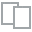
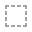
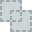
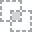
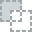
...
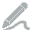
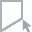
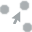
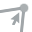
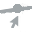

In [44]:
plot(icu_height_weight, 'weight_first')

  0%|          | 0/107 [00:00<?, ?it/s]


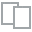
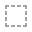
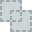
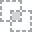
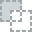
...
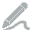
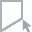
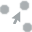
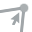
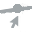

In [45]:
plot(icu_height_weight, 'height_first')

  0%|          | 0/107 [00:00<?, ?it/s]


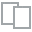
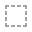
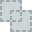
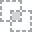
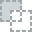
...
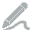
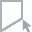
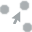
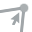
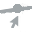

In [46]:
plot(icu_height_weight, 'weight_diff')

  0%|          | 0/107 [00:00<?, ?it/s]


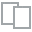
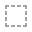
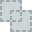
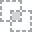
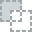
...
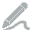
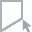
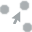
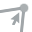
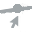

In [47]:
plot(icu_height_weight, 'BMI')

**Remove Outliers in the dataset**

In [48]:
Q1 = icu_height_weight.quantile(0.25)
Q3 = icu_height_weight.quantile(0.75)
IQR = Q3 - Q1
print(IQR)
icu_height_weight = icu_height_weight[~((icu_height_weight < (Q1 - 1.5 * IQR)) |(icu_height_weight > (Q3 + 1.5 * IQR))).any(axis=1)]

weight_first    29.400000
height_first    20.320000
weight_diff      4.400000
BMI              9.034528
dtype: float64


  0%|          | 0/107 [00:00<?, ?it/s]


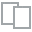
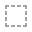
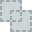
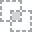
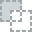
...
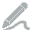
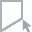
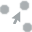
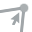
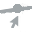

In [49]:
plot(icu_height_weight, 'weight_first')

  0%|          | 0/107 [00:00<?, ?it/s]


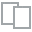
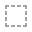
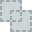
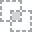
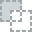
...
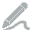
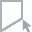
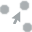
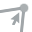
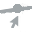

In [50]:
plot(icu_height_weight, 'height_first')

  0%|          | 0/107 [00:00<?, ?it/s]


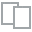
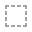
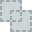
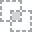
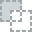
...
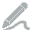
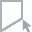
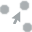
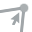
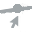

In [51]:
plot(icu_height_weight, 'weight_diff')

  0%|          | 0/107 [00:00<?, ?it/s]


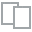
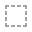
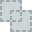
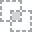
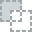
...
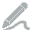
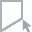
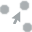
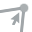
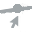

In [52]:
plot(icu_height_weight, 'BMI')

**Severity of Illness Scores Data**

In [53]:
# Read three different Severity Scores
oasis = pd.read_csv('./oasis.csv')
saps = pd.read_csv('./saps.csv')
sofa = pd.read_csv('./sofa.csv')
# Explore data set
print(oasis.head(5))
print(oasis['icustay_age_group'].value_counts())
print(saps.head(5))
print(sofa.head(5))
# Keep useful columns
oasis = oasis[['icustay_id', 'oasis', 'oasis_PROB']]
saps = saps[['icustay_id', 'SAPS']].rename(columns={'SAPS': "saps"})
sofa = sofa.rename(columns={'SOFA': "sofa"}) 

   subject_id  hadm_id  icustay_id icustay_age_group  hospital_expire_flag  \
0       55973   152234      200001             adult                     0   
1       27513   163557      200003             adult                     0   
2       10950   189514      200006             adult                     0   
3       20707   129310      200007             adult                     0   
4       29904   129607      200009             adult                     0   

   icustay_expire_flag  oasis  oasis_PROB  age  age_score  ...  resprate  \
0                    0     42    0.305849   61          6  ...      32.0   
1                    0     35    0.152892   48          3  ...      39.0   
2                    0     32    0.109623   54          6  ...      27.0   
3                    0     26    0.054187   44          3  ...      29.0   
4                    0     25    0.048012   47          3  ...      17.5   

   resprate_score       temp  temp_score  urineoutput  urineoutput_score  

**Data Aggregation**

In [54]:
# Merge with the demographic dataset
merged_icu_demo = icu_demo.merge(icu_height_weight, on='icustay_id', how='left')
merged_icu_demo = merged_icu_demo.merge(oasis, on='icustay_id', how='left')
merged_icu_demo = merged_icu_demo.merge(saps, on='icustay_id', how='left')
merged_icu_demo = merged_icu_demo.merge(sofa, on='icustay_id', how='left')
# Set ids as index of each row
print(merged_icu_demo.info())
print()
# Show stats of each column
print(merged_icu_demo.describe())
# Remove respiration and liver columns
# Because we can use SOFA score and almost half of patients does not have that data.
merged_icu_demo = merged_icu_demo.drop(columns=['respiration', 'liver'])
# Remove height_first
merged_icu_demo = merged_icu_demo.drop(columns=['height_first', 'BMI'])
# Drop roles contain missing values
merged_icu_demo = merged_icu_demo.dropna()
print(merged_icu_demo.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23944 entries, 0 to 23943
Data columns (total 26 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   icustay_id      23944 non-null  int64   
 1   gender          23944 non-null  category
 2   age             23944 non-null  float64 
 3   admission_type  23944 non-null  category
 4   first_careunit  23944 non-null  category
 5   mort_icu        23944 non-null  int64   
 6   mort_hosp       23944 non-null  int64   
 7   readmission_30  23944 non-null  int64   
 8   los_3           23944 non-null  int64   
 9   los_7           23944 non-null  int64   
 10  weight_first    19843 non-null  float64 
 11  height_first    9868 non-null   float64 
 12  weight_diff     19843 non-null  float64 
 13  BMI             9862 non-null   float64 
 14  oasis           23944 non-null  int64   
 15  oasis_PROB      23944 non-null  float64 
 16  saps            23944 non-null  int64   
 17  subject_id  

  0%|          | 0/1470 [00:00<?, ?it/s]


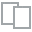
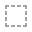
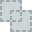
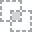
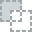
...
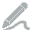
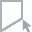
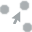
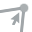
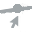

In [55]:
# visualize distribution of each column
plot(merged_icu_demo.drop(columns=['icustay_id', 'subject_id', 'hadm_id']))

In [56]:
merged_icu_demo.set_index(['icustay_id', 'subject_id', 'hadm_id'], inplace=True)
merged_icu_demo.head(5)

,,,gender,age,admission_type,first_careunit,mort_icu,mort_hosp,readmission_30,los_3,los_7,weight_first,weight_diff,oasis,oasis_PROB,saps,sofa,coagulation,cardiovascular,cns,renal
icustay_id,subject_id,hadm_id,,,,,,,,,,,,,,,,,,,
294638,4,185777,F,47.845047,EMERGENCY,MICU,0,0,0,0,0,53.6,0.0,26,0.054187,10,4,0.0,1.0,0.0,0.0
220597,9,150750,M,41.790228,EMERGENCY,MICU,1,1,0,1,0,104.0,3.7,35,0.152892,18,5,0.0,1.0,0.0,1.0
263738,13,143045,F,39.866118,EMERGENCY,CCU,0,0,0,1,0,73.5,3.7,34,0.137099,18,1,1.0,0.0,0.0,0.0
277042,17,194023,F,47.455336,ELECTIVE,CSRU,0,0,0,0,0,67.9,0.0,38,0.209226,22,7,1.0,1.0,4.0,0.0
217847,21,109451,M,87.440295,EMERGENCY,CCU,0,0,0,1,0,65.6,1.4,36,0.170145,25,7,0.0,1.0,1.0,3.0


In [57]:
#merged_icu_demo['diagnosis_at_admission'].value_counts()

**Clean merged demographic Data**


In [58]:
# # Split features and labels for data cleaning
label_columns = ['los_3', 'los_7', 'mort_icu', 'mort_hosp']
features = merged_icu_demo.drop(columns=label_columns)
labels = merged_icu_demo[label_columns]
cat_cols = ['gender', 'ethnicity', 'admission_type', 'first_careunit']
cleaned_features = pd.get_dummies(features)
# # remove outliers by demographic data
# clf = OneClassSVM(gamma='auto', nu=0.01).fit(cleaned_features)
# outlier_result = clf.predict(cleaned_features)
# (unique, counts) = np.unique(outlier_result, return_counts=True)
# print('Remove %s outlier data samples'%counts[0])
# # select all rows that are not outliers
# cleaned_features['mask'] = outlier_result.tolist()
# labels['mask'] = outlier_result.tolist()
# cleaned_features = cleaned_features[cleaned_features['mask'] == 1]
# labels = labels[labels['mask'] == 1]
# cleaned_features = cleaned_features.drop(columns=['mask'])
# labels = labels.drop(columns=['mask'])
cleaned_df = cleaned_features.merge(labels, on='icustay_id', how='inner')
# print(cleaned_df)

In [59]:
# plot(cleaned_df)
# print(cleaned_df.columns)

In [60]:
final_df = cleaned_df.merge(vitals, on='icustay_id', how='inner')
final_df

/Users/kyounhuh/opt/anaconda3/lib/python3.8/site-packages/pandas/core/reshape/merge.py:648: UserWarning: merging between different levels can give an unintended result (1 levels on the left,3 on the right)
  warnings.warn(msg, UserWarning)


,age,readmission_30,weight_first,weight_diff,oasis,oasis_PROB,saps,sofa,coagulation,cardiovascular,...,"(white blood cell count urine, time_since_measured, 14)","(white blood cell count urine, time_since_measured, 15)","(white blood cell count urine, time_since_measured, 16)","(white blood cell count urine, time_since_measured, 17)","(white blood cell count urine, time_since_measured, 18)","(white blood cell count urine, time_since_measured, 19)","(white blood cell count urine, time_since_measured, 20)","(white blood cell count urine, time_since_measured, 21)","(white blood cell count urine, time_since_measured, 22)","(white blood cell count urine, time_since_measured, 23)"
icustay_id,,,,,,,,,,,,,,,,,,,,,
294638,47.845047,0,53.6,0.0,26,0.054187,10,4,0.0,1.0,...,30.0,31.0,32.0,33.0,34.0,35.0,36.0,37.0,38.0,39.0
220597,41.790228,0,104.0,3.7,35,0.152892,18,5,0.0,1.0,...,78.0,79.0,80.0,81.0,82.0,83.0,84.0,85.0,86.0,87.0
263738,39.866118,0,73.5,3.7,34,0.137099,18,1,1.0,0.0,...,150.0,151.0,152.0,153.0,154.0,155.0,156.0,157.0,158.0,159.0
277042,47.455336,0,67.9,0.0,38,0.209226,22,7,1.0,1.0,...,174.0,175.0,176.0,177.0,178.0,179.0,180.0,181.0,182.0,183.0
217847,87.440295,0,65.6,1.4,36,0.170145,25,7,0.0,1.0,...,222.0,223.0,224.0,225.0,226.0,227.0,228.0,229.0,230.0,231.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
275083,65.499326,0,105.0,0.0,24,0.042509,17,2,0.0,1.0,...,110.0,111.0,112.0,113.0,114.0,115.0,116.0,117.0,118.0,119.0
221194,65.158164,0,71.2,10.8,24,0.042509,15,4,1.0,1.0,...,134.0,135.0,136.0,137.0,138.0,139.0,140.0,141.0,142.0,143.0
226241,47.729259,0,100.5,0.0,21,0.029395,19,4,0.0,0.0,...,14.0,15.0,16.0,17.0,18.0,19.0,20.0,21.0,22.0,23.0


# Feature Selection

In [61]:
%%time
cat_features = ['readmission_30', 'gender_F', 'gender_M', 'admission_type_ELECTIVE',
                'admission_type_EMERGENCY', 'admission_type_URGENT',
                'first_careunit_CCU', 'first_careunit_CSRU', 'first_careunit_MICU',
                'first_careunit_SICU', 'first_careunit_TSICU' ]
labels_name = ['los_3', 'los_7', 'mort_icu', 'mort_hosp']
# Features
non_numerical = labels_name + cat_features
num_X = final_df.drop(columns=non_numerical)
#print(num_X)
cat_X = final_df[cat_features]
#print(cat_X)
# Labels
y = final_df[labels_name]
#print(y)

# Create and fit feature selector
# Use chi-square find k best features for categorical input and output
cat_X_chi = SelectKBest(chi2, k=8).fit(cat_X, y)
# Get columns to keep and create new dataframe with those only
chi_cols = cat_X_chi.get_support(indices=True)
chi_X_names = cat_X.columns
chi_cat_X = []
for col_idx in chi_cols:
  chi_cat_X.append(chi_X_names[col_idx])
print('Selected Features by Chi-square: ', chi_cat_X)
#chi_X_new = cat_X.iloc[:, chi_cols]
#chi_final = 

mut_common_features = []
# Create and fit feature selector
# Use mutual information find k best features for categorical input and output
for label_name in labels_name:
  print('***Label: ' + label_name + '***')
  cat_X_mut = SelectKBest(mutual_info_classif, k=6).fit(cat_X, y[label_name])
  # Get columns to keep and create new dataframe with those only
  mut_cols = cat_X_mut.get_support(indices=True)
  mut_X_names = cat_X.columns
  mut_cat_X = []
  for col_idx in mut_cols:
    mut_cat_X.append(mut_X_names[col_idx])
  print('Selected Features by mutual information: ', mut_cat_X)
  mut_common_features += mut_cat_X
  # mut_X_new = cat_X.iloc[:, mut_cols]
# Get a list of common important features names
mut_common_features = list(set(mut_common_features))
print('Common selected features by mutual information: ', mut_common_features)
print('Common features Count by mutual information: ', len(mut_common_features))

ano_common_features = []
# Use ANOVA find k best features for numerical input and categorical output
for label_name in labels_name:
  print('***Label: ' + label_name + '***')
  num_X_selector = SelectKBest(f_classif, k=20).fit(num_X , y[label_name])
  # Get columns to keep and create new dataframe with those only
  num_cols = num_X_selector.get_support(indices=True)
  num_X_names = num_X.columns
  num_X_cols = []
  for col_idx in num_cols:
    num_X_cols.append(num_X_names[col_idx])
  print('Selected Features by ANOVA (show top 20 out of 500): ', num_X_cols[0:10])
  ano_common_features += num_X_cols
  # num_X_new = num_X.iloc[:, num_cols]
# Get a list of common important features names
ano_common_features = list(set(ano_common_features))
print('Common selected features by ANOVA (show 20 only): ', ano_common_features[0:10])
print('Common features count by ANOVA: ', len(ano_common_features))

Selected Features by Chi-square:  ['readmission_30', 'gender_F', 'admission_type_ELECTIVE', 'admission_type_EMERGENCY', 'admission_type_URGENT', 'first_careunit_CSRU', 'first_careunit_MICU', 'first_careunit_SICU']
***Label: los_3***
Selected Features by mutual information:  ['gender_F', 'admission_type_EMERGENCY', 'admission_type_URGENT', 'first_careunit_MICU', 'first_careunit_SICU', 'first_careunit_TSICU']
***Label: los_7***
Selected Features by mutual information:  ['gender_F', 'gender_M', 'admission_type_EMERGENCY', 'admission_type_URGENT', 'first_careunit_CCU', 'first_careunit_MICU']
***Label: mort_icu***
Selected Features by mutual information:  ['readmission_30', 'gender_F', 'gender_M', 'admission_type_ELECTIVE', 'admission_type_EMERGENCY', 'admission_type_URGENT']
***Label: mort_hosp***
Selected Features by mutual information:  ['gender_F', 'admission_type_ELECTIVE', 'admission_type_EMERGENCY', 'first_careunit_CSRU', 'first_careunit_MICU', 'first_careunit_TSICU']
Common selected

/Users/kyounhuh/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:114: UserWarning: Features [ 162  169  172  175  178  229  234  236  244  249  316  318  320  321
 1032 1033 1038 1961 1962 1964 1970 1971 1972 1973 1975 1978 2027 2029
 2030 2031 2032 2034 2036 2037 2038 2039 2040 2042 2043 2044 2046 2047
 2048 2049 2050 2100 2103 2104 2106 2107 2108 2111 2112 2113 2115 2116
 2118 2119 2120 2121 2336 3540 3541 3542 3545 3548 3549 3551 3552 3553
 3554 3555 3556 3557 3558 3559 3560 3561 3562 3694 3698 3702] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
/Users/kyounhuh/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Selected Features by ANOVA (show top 20 out of 500):  ['weight_diff', 'oasis', 'saps', ('co2 (etco2, pco2, etc.)', 'time_since_measured', 21), ('co2 (etco2, pco2, etc.)', 'time_since_measured', 22), ('co2 (etco2, pco2, etc.)', 'time_since_measured', 23), ('glascow coma scale total', 'mean', 15), ('glascow coma scale total', 'mean', 16), ('glascow coma scale total', 'mean', 17), ('glascow coma scale total', 'mean', 18)]
***Label: los_7***


/Users/kyounhuh/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:114: UserWarning: Features [ 162  169  172  175  178  229  234  236  244  249  316  318  320  321
 1032 1033 1038 1961 1962 1964 1970 1971 1972 1973 1975 1978 2027 2029
 2030 2031 2032 2034 2036 2037 2038 2039 2040 2042 2043 2044 2046 2047
 2048 2049 2050 2100 2103 2104 2106 2107 2108 2111 2112 2113 2115 2116
 2118 2119 2120 2121 2336 3540 3541 3542 3545 3548 3549 3551 3552 3553
 3554 3555 3556 3557 3558 3559 3560 3561 3562 3694 3698 3702] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
/Users/kyounhuh/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Selected Features by ANOVA (show top 20 out of 500):  ['weight_diff', 'oasis', 'oasis_PROB', ('glascow coma scale total', 'mean', 14), ('glascow coma scale total', 'mean', 15), ('glascow coma scale total', 'mean', 16), ('glascow coma scale total', 'mean', 17), ('glascow coma scale total', 'mean', 18), ('glascow coma scale total', 'mean', 19), ('glascow coma scale total', 'mean', 20)]
***Label: mort_icu***


/Users/kyounhuh/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:114: UserWarning: Features [ 162  169  172  175  178  229  234  236  244  249  316  318  320  321
 1032 1033 1038 1961 1962 1964 1970 1971 1972 1973 1975 1978 2027 2029
 2030 2031 2032 2034 2036 2037 2038 2039 2040 2042 2043 2044 2046 2047
 2048 2049 2050 2100 2103 2104 2106 2107 2108 2111 2112 2113 2115 2116
 2118 2119 2120 2121 2336 3540 3541 3542 3545 3548 3549 3551 3552 3553
 3554 3555 3556 3557 3558 3559 3560 3561 3562 3694 3698 3702] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
/Users/kyounhuh/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Selected Features by ANOVA (show top 20 out of 500):  ['oasis', 'oasis_PROB', 'saps', 'sofa', ('anion gap', 'mean', 21), ('anion gap', 'mean', 22), ('anion gap', 'mean', 23), ('glascow coma scale total', 'mean', 11), ('glascow coma scale total', 'mean', 12), ('glascow coma scale total', 'mean', 13)]
***Label: mort_hosp***


/Users/kyounhuh/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:114: UserWarning: Features [ 162  169  172  175  178  229  234  236  244  249  316  318  320  321
 1032 1033 1038 1961 1962 1964 1970 1971 1972 1973 1975 1978 2027 2029
 2030 2031 2032 2034 2036 2037 2038 2039 2040 2042 2043 2044 2046 2047
 2048 2049 2050 2100 2103 2104 2106 2107 2108 2111 2112 2113 2115 2116
 2118 2119 2120 2121 2336 3540 3541 3542 3545 3548 3549 3551 3552 3553
 3554 3555 3556 3557 3558 3559 3560 3561 3562 3694 3698 3702] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
/Users/kyounhuh/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Selected Features by ANOVA (show top 20 out of 500):  ['oasis', 'oasis_PROB', 'saps', 'sofa', ('anion gap', 'mean', 19), ('anion gap', 'mean', 20), ('anion gap', 'mean', 21), ('anion gap', 'mean', 22), ('anion gap', 'mean', 23), ('glascow coma scale total', 'mean', 13)]
Common selected features by ANOVA (show 20 only):  [('peak inspiratory pressure', 'mask', 22), ('glascow coma scale total', 'mean', 12), ('glascow coma scale total', 'mean', 15), ('glascow coma scale total', 'mean', 21), ('glascow coma scale total', 'mean', 18), ('co2 (etco2, pco2, etc.)', 'time_since_measured', 22), ('anion gap', 'mean', 21), 'weight_diff', 'sofa', ('ph', 'time_since_measured', 22)]
Common features count by ANOVA:  38
CPU times: user 19.4 s, sys: 8.91 s, total: 28.4 s
Wall time: 30.2 s


In [62]:
# Selected features list by chi + ANOVA
chi_ano_features = chi_cat_X + ano_common_features + labels_name
ca_final = final_df[chi_ano_features]
print("Shape of chi + ANOVA data: ", ca_final.shape)
# Selected features list by mutual info + ANOVA
mut_ano_features = mut_common_features + ano_common_features + labels_name
ma_final = final_df[mut_ano_features]
print("Shape of mutual info + ANOVA data: ", ma_final.shape)

Shape of chi + ANOVA data:  (19646, 50)
Shape of mutual info + ANOVA data:  (19646, 53)


/Users/kyounhuh/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


In [63]:
ca_final

,readmission_30,gender_F,admission_type_ELECTIVE,admission_type_EMERGENCY,admission_type_URGENT,first_careunit_CSRU,first_careunit_MICU,first_careunit_SICU,"(peak inspiratory pressure, mask, 22)","(glascow coma scale total, mean, 12)",...,"(anion gap, mean, 19)","(co2 (etco2, pco2, etc.), time_since_measured, 23)","(plateau pressure, mask, 22)",saps,"(partial pressure of carbon dioxide, time_since_measured, 23)","(ph, time_since_measured, 23)",los_3,los_7,mort_icu,mort_hosp
icustay_id,,,,,,,,,,,,,,,,,,,,,
294638,0,1,0,1,0,0,1,0,0.0,0.794764,...,0.163099,23.0,0.0,10,23.0,23.0,0,0,0,0
220597,0,0,0,1,0,0,1,0,0.0,-2.289829,...,-0.323513,10.0,0.0,18,10.0,10.0,1,0,1,1
263738,0,1,0,1,0,0,0,0,1.0,0.794764,...,-1.053432,1.0,1.0,18,1.0,1.0,1,0,0,0
277042,0,1,1,0,0,1,0,0,0.0,0.794764,...,-0.566819,15.0,0.0,22,15.0,2.0,0,0,0,0
217847,0,0,0,1,0,0,0,0,0.0,0.794764,...,3.082774,0.0,0.0,25,0.0,0.0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
275083,0,1,0,1,0,0,1,0,0.0,0.000000,...,-0.080207,119.0,0.0,17,119.0,16.0,0,0,0,0
221194,0,0,0,1,0,1,0,0,0.0,0.000000,...,-0.323513,0.0,0.0,15,0.0,0.0,1,1,0,0
226241,0,0,1,0,0,0,0,0,0.0,0.000000,...,-0.566819,13.0,0.0,19,13.0,13.0,1,0,0,0


# Modeling

In [64]:
import copy, math, os, pickle, time, pandas as pd, numpy as np, scipy.stats as ss

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import average_precision_score, roc_auc_score, accuracy_score, f1_score
from sklearn.model_selection import train_test_split

In [65]:
class DictDist():
    def __init__(self, dict_of_rvs): self.dict_of_rvs = dict_of_rvs
    def rvs(self, n):
        a = {k: v.rvs(n) for k, v in self.dict_of_rvs.items()}
        out = []
        for i in range(n): out.append({k: vs[i] for k, vs in a.items()})
        return out
    
class Choice():
    def __init__(self, options): self.options = options
    def rvs(self, n): return [self.options[i] for i in ss.randint(0, len(self.options)).rvs(n)]

In [66]:
label_cols = ['los_3', 'los_7', 'mort_icu', 'mort_hosp']
# X = ma_final.drop(label_cols, axis=1)
X = ca_final.drop(label_cols, axis=1)

# Ys = ma_final[label_cols]
Ys = ca_final[label_cols]

In [67]:
X_flat_train, X_flat_test, Ys_train, Ys_test = train_test_split(X, Ys, test_size=0.2, random_state=1)

X_flat_train, X_flat_dev, Ys_train, Ys_dev = train_test_split(X_flat_train, Ys_train, test_size=0.125, random_state=1)

In [68]:
N = 15

RF_dist = DictDist({
    'n_estimators': ss.randint(50, 500),
    'max_depth': ss.randint(2, 10),
    'min_samples_split': ss.randint(2, 75),
    'min_samples_leaf': ss.randint(1, 50),
})
np.random.seed(SEED)
RF_hyperparams_list = RF_dist.rvs(N)

In [69]:
def run_basic(model_type, model, hyperparams_list, X_flat_train, X_flat_dev, X_flat_test, target):
    best_s, best_hyperparams = -np.Inf, None
    for i, hyperparams in enumerate(hyperparams_list):
#         print("On sample %d / %d (hyperparams = %s)" % (i+1, len(hyperparams_list), repr((hyperparams))))
        M = model(**hyperparams)
        M.fit(X_flat_train, Ys_train
              [target])
        s = roc_auc_score(Ys_dev[target], M.predict_proba(X_flat_dev)[:, 1])
        if s > best_s:
            best_s, best_hyperparams = s, hyperparams
            print("New Best Score: %.2f @ hyperparams = %s" % (100*best_s, repr((best_hyperparams))))
    return run_only_final(model_type, model, best_hyperparams, X_flat_train, X_flat_dev, X_flat_test, target)

# function to run the best final model
def run_only_final(model_type, model, best_hyperparams, X_flat_train, X_flat_dev, X_flat_test, target):
    best_M = model(**best_hyperparams)
    best_M.fit(pd.concat((X_flat_train, X_flat_dev)), pd.concat((Ys_train, Ys_dev))[target])
    # summarize feature importance
    # get feature importance score
    importance = None
    if model_type == 'RF':
      importance = best_M.feature_importances_
    elif model_type == 'LR':
      importance = best_M.coef_[0]
    # target title dictionary
    target_dict = {'mort_icu': 'Mortaility ICU', 'los_3': 'Length of Stay Longer than 7', 
                  'mort_hosp': 'Mortaility Hospital', 'los_7': 'Length of Stay Longer than 7'}
    for idx, val in enumerate(importance):
      print('Feature: %0d, Score: %.5f' % (idx, val))
    # plot feature importance
    fig, ax = plt.subplots()
    feat_bar = ax.bar([x for x in range(len(importance))], importance)
    ax.set_xlabel('Features Index')
    ax.set_ylabel('Feature Score')
    ax.set_title(target_dict[target] +' Feature Score' )
    plt.show()
    y_true  = Ys_test[target]
    y_score = best_M.predict_proba(X_flat_test)[:, 1]
    y_pred  = best_M.predict(X_flat_test)

    auc   = roc_auc_score(y_true, y_score)
    auprc = average_precision_score(y_true, y_score)
    acc   = accuracy_score(y_true, y_pred)
    F1    = f1_score(y_true, y_pred)
    
    return best_M, best_hyperparams, auc, auprc, acc, F1

In [70]:
RESULTS_PATH = 'RF_model.pkl'
# with open(RESULTS_PATH, mode='rb') as f: results = pickle.load(f)
    
RERUN = True

Running model RF on target mort_icu with representation lvl2
New Best Score: 85.00 @ hyperparams = {'n_estimators': 87, 'max_depth': 3, 'min_samples_split': 15, 'min_samples_leaf': 8}
New Best Score: 85.86 @ hyperparams = {'n_estimators': 285, 'max_depth': 4, 'min_samples_split': 11, 'min_samples_leaf': 4}
New Best Score: 86.54 @ hyperparams = {'n_estimators': 446, 'max_depth': 6, 'min_samples_split': 9, 'min_samples_leaf': 7}
New Best Score: 87.05 @ hyperparams = {'n_estimators': 122, 'max_depth': 8, 'min_samples_split': 65, 'min_samples_leaf': 22}
Feature: 0, Score: 0.00041
Feature: 1, Score: 0.00138
Feature: 2, Score: 0.00126
Feature: 3, Score: 0.00123
Feature: 4, Score: 0.00005
Feature: 5, Score: 0.01051
Feature: 6, Score: 0.00308
Feature: 7, Score: 0.00097
Feature: 8, Score: 0.00250
Feature: 9, Score: 0.01062
Feature: 10, Score: 0.01699
Feature: 11, Score: 0.07065
Feature: 12, Score: 0.02798
Feature: 13, Score: 0.00854
Feature: 14, Score: 0.02618
Feature: 15, Score: 0.03047
Featur

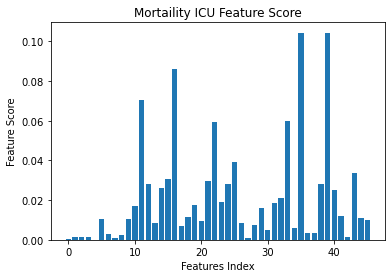

Final results for model RF on target mort_icu with representation lvl2
(0.8758875863637997, 0.475260566948856, 0.9330788804071247, 0.27548209366391185)
Running model RF on target los_3 with representation lvl2
New Best Score: 69.30 @ hyperparams = {'n_estimators': 87, 'max_depth': 3, 'min_samples_split': 15, 'min_samples_leaf': 8}
New Best Score: 70.40 @ hyperparams = {'n_estimators': 285, 'max_depth': 4, 'min_samples_split': 11, 'min_samples_leaf': 4}
New Best Score: 72.07 @ hyperparams = {'n_estimators': 446, 'max_depth': 6, 'min_samples_split': 9, 'min_samples_leaf': 7}
New Best Score: 72.73 @ hyperparams = {'n_estimators': 122, 'max_depth': 8, 'min_samples_split': 65, 'min_samples_leaf': 22}
Feature: 0, Score: 0.00070
Feature: 1, Score: 0.00187
Feature: 2, Score: 0.00553
Feature: 3, Score: 0.00387
Feature: 4, Score: 0.00016
Feature: 5, Score: 0.02508
Feature: 6, Score: 0.00548
Feature: 7, Score: 0.00271
Feature: 8, Score: 0.00595
Feature: 9, Score: 0.00965
Feature: 10, Score: 0.006

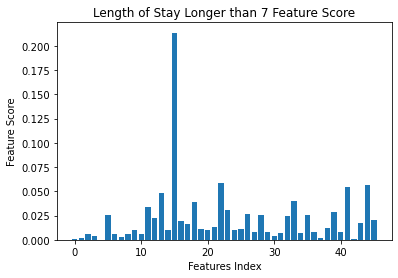

Final results for model RF on target los_3 with representation lvl2
(0.7297587514641577, 0.6732177896607641, 0.6824427480916031, 0.5445255474452555)
Running model RF on target mort_hosp with representation lvl2
New Best Score: 80.05 @ hyperparams = {'n_estimators': 87, 'max_depth': 3, 'min_samples_split': 15, 'min_samples_leaf': 8}
New Best Score: 80.71 @ hyperparams = {'n_estimators': 285, 'max_depth': 4, 'min_samples_split': 11, 'min_samples_leaf': 4}
New Best Score: 81.88 @ hyperparams = {'n_estimators': 446, 'max_depth': 6, 'min_samples_split': 9, 'min_samples_leaf': 7}
New Best Score: 82.39 @ hyperparams = {'n_estimators': 122, 'max_depth': 8, 'min_samples_split': 65, 'min_samples_leaf': 22}
Feature: 0, Score: 0.00290
Feature: 1, Score: 0.00220
Feature: 2, Score: 0.00309
Feature: 3, Score: 0.00289
Feature: 4, Score: 0.00004
Feature: 5, Score: 0.01622
Feature: 6, Score: 0.00349
Feature: 7, Score: 0.00240
Feature: 8, Score: 0.00148
Feature: 9, Score: 0.01279
Feature: 10, Score: 0.01

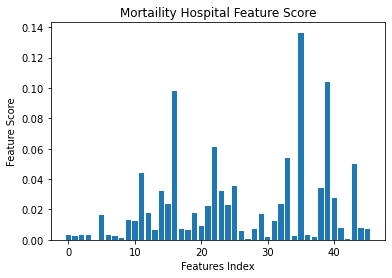

Final results for model RF on target mort_hosp with representation lvl2
(0.8403620789234445, 0.4752001428672343, 0.9012722646310433, 0.2814814814814815)
Running model RF on target los_7 with representation lvl2
New Best Score: 73.71 @ hyperparams = {'n_estimators': 87, 'max_depth': 3, 'min_samples_split': 15, 'min_samples_leaf': 8}
New Best Score: 74.84 @ hyperparams = {'n_estimators': 285, 'max_depth': 4, 'min_samples_split': 11, 'min_samples_leaf': 4}
New Best Score: 75.80 @ hyperparams = {'n_estimators': 446, 'max_depth': 6, 'min_samples_split': 9, 'min_samples_leaf': 7}
New Best Score: 75.99 @ hyperparams = {'n_estimators': 122, 'max_depth': 8, 'min_samples_split': 65, 'min_samples_leaf': 22}
Feature: 0, Score: 0.00219
Feature: 1, Score: 0.00524
Feature: 2, Score: 0.00531
Feature: 3, Score: 0.00592
Feature: 4, Score: 0.00080
Feature: 5, Score: 0.03319
Feature: 6, Score: 0.00774
Feature: 7, Score: 0.00825
Feature: 8, Score: 0.01054
Feature: 9, Score: 0.01043
Feature: 10, Score: 0.01

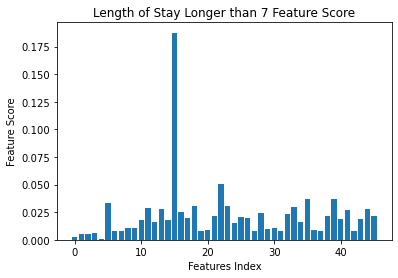

Final results for model RF on target los_7 with representation lvl2
(0.7960832968673583, 0.2612143132776037, 0.9325699745547074, 0.0)
CPU times: user 1min 44s, sys: 633 ms, total: 1min 44s
Wall time: 1min 46s


In [71]:
%%time
results = {}
for model_name, model, hyperparams_list in [
    ('RF', RandomForestClassifier, RF_hyperparams_list)]:
    if model_name not in results: 
        results[model_name] = {}
    for t in ['mort_icu', 'los_3', 'mort_hosp', 'los_7']:
        if t not in results[model_name]:
            results[model_name][t] = {}
        for n, X_flat_train, X_flat_dev, X_flat_test in [
            ('lvl2', X_flat_train, X_flat_dev, X_flat_test)]:
            if n in results[model_name][t]:
                print("Finished model %s on target %s with representation %s" % (model_name, t, n))
                if RERUN: 
                    h = results[model_name][t][n][1]
                    results[model_name][t][n] = run_only_final(model, h, X_flat_train, X_flat_dev, X_flat_test, t)
                    
                    print("Final results for model %s on target %s with representation %s" % (model_name, t, n))
                    print(results[model_name][t][n][2:])

                    with open(RESULTS_PATH, mode='wb') as f: pickle.dump(results, f)
                continue
                
            print("Running model %s on target %s with representation %s" % (model_name, t, n))
            results[model_name][t][n] = run_basic(
                'RF', model, hyperparams_list, X_flat_train, X_flat_dev, X_flat_test, t
            )
            print("Final results for model %s on target %s with representation %s" % (model_name, t, n))
            print(results[model_name][t][n][2:])
            with open(RESULTS_PATH, mode='wb') as f: pickle.dump(results, f)

In [72]:
RESULTS_PATH = 'LR_model.pkl'
# with open(RESULTS_PATH, mode='rb') as f: results = pickle.load(f)
    
RERUN = True

In [73]:
N = 15

LR_dist = DictDist({
    'C': Choice(np.geomspace(1e-3, 1e3, 10000)),
    'penalty': Choice(['l1', 'l2']),
    'solver': Choice(['liblinear', 'lbfgs']),
    'max_iter': Choice([500, 1000])
})
np.random.seed(SEED)
LR_hyperparams_list = LR_dist.rvs(N)
for i in range(N):
    if LR_hyperparams_list[i]['solver'] == 'lbfgs': 
        LR_hyperparams_list[i]['penalty'] = 'l2'

Running model LR on target mort_icu with representation lvl2
New Best Score: 78.32 @ hyperparams = {'C': 0.001383611303681924, 'penalty': 'l2', 'solver': 'liblinear', 'max_iter': 1000}


/Users/kyounhuh/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


New Best Score: 87.04 @ hyperparams = {'C': 1.3047026700306064, 'penalty': 'l2', 'solver': 'lbfgs', 'max_iter': 1000}


/Users/kyounhuh/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


New Best Score: 87.22 @ hyperparams = {'C': 48.783036208459954, 'penalty': 'l2', 'solver': 'lbfgs', 'max_iter': 500}


/Users/kyounhuh/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/kyounhuh/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html

Feature: 0, Score: -3.56305
Feature: 1, Score: 0.06562
Feature: 2, Score: -2.18764
Feature: 3, Score: -1.15192
Feature: 4, Score: -1.11656
Feature: 5, Score: -1.01075
Feature: 6, Score: -0.05740
Feature: 7, Score: 0.24871
Feature: 8, Score: 0.60578
Feature: 9, Score: -0.14940
Feature: 10, Score: -0.19452
Feature: 11, Score: -0.26164
Feature: 12, Score: 0.01456
Feature: 13, Score: 0.07305
Feature: 14, Score: 0.00191
Feature: 15, Score: -0.07745
Feature: 16, Score: 0.07734
Feature: 17, Score: 0.02095
Feature: 18, Score: -0.09755
Feature: 19, Score: 0.13769
Feature: 20, Score: 0.30915
Feature: 21, Score: -0.14888
Feature: 22, Score: -0.67899
Feature: 23, Score: 0.20775
Feature: 24, Score: -0.28733
Feature: 25, Score: 1.01477
Feature: 26, Score: 0.09075
Feature: 27, Score: -0.55828
Feature: 28, Score: -0.07985
Feature: 29, Score: 0.22146
Feature: 30, Score: 0.21260
Feature: 31, Score: -0.15063
Feature: 32, Score: -0.19849
Feature: 33, Score: 0.16003
Feature: 34, Score: 0.34841
Feature: 35,

/Users/kyounhuh/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


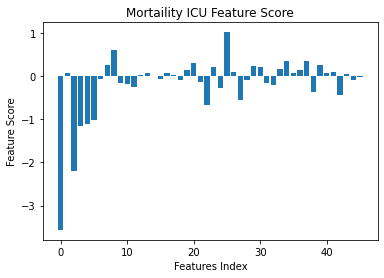

Final results for model LR on target mort_icu with representation lvl2
(0.8822366669767674, 0.47767928873906046, 0.9323155216284987, 0.3282828282828283)
Running model LR on target los_3 with representation lvl2
New Best Score: 69.82 @ hyperparams = {'C': 0.001383611303681924, 'penalty': 'l2', 'solver': 'liblinear', 'max_iter': 1000}


/Users/kyounhuh/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


New Best Score: 71.41 @ hyperparams = {'C': 1.3047026700306064, 'penalty': 'l2', 'solver': 'lbfgs', 'max_iter': 1000}


/Users/kyounhuh/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/kyounhuh/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html

New Best Score: 71.42 @ hyperparams = {'C': 0.3429679403524682, 'penalty': 'l1', 'solver': 'liblinear', 'max_iter': 1000}


/Users/kyounhuh/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


New Best Score: 71.45 @ hyperparams = {'C': 44.77804273778909, 'penalty': 'l2', 'solver': 'lbfgs', 'max_iter': 1000}


/Users/kyounhuh/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/kyounhuh/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html

Feature: 0, Score: 0.28213
Feature: 1, Score: 0.03262
Feature: 2, Score: -0.58718
Feature: 3, Score: -0.35557
Feature: 4, Score: -0.30798
Feature: 5, Score: -0.90373
Feature: 6, Score: -0.06118
Feature: 7, Score: -0.02763
Feature: 8, Score: 0.27299
Feature: 9, Score: 0.16138
Feature: 10, Score: -0.04518
Feature: 11, Score: -0.01660
Feature: 12, Score: -0.00293
Feature: 13, Score: 0.00658
Feature: 14, Score: -0.29937
Feature: 15, Score: 0.19372
Feature: 16, Score: 0.03504
Feature: 17, Score: 0.01994
Feature: 18, Score: -0.02746
Feature: 19, Score: 0.05213
Feature: 20, Score: 0.21757
Feature: 21, Score: -0.02133
Feature: 22, Score: -0.41013
Feature: 23, Score: -0.04753
Feature: 24, Score: 0.19041
Feature: 25, Score: 0.16340
Feature: 26, Score: 0.02506
Feature: 27, Score: 0.51724
Feature: 28, Score: -0.00898
Feature: 29, Score: -0.08327
Feature: 30, Score: 0.12174
Feature: 31, Score: -0.25119
Feature: 32, Score: -0.12428
Feature: 33, Score: 0.28515
Feature: 34, Score: 0.44500
Feature: 35,

/Users/kyounhuh/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


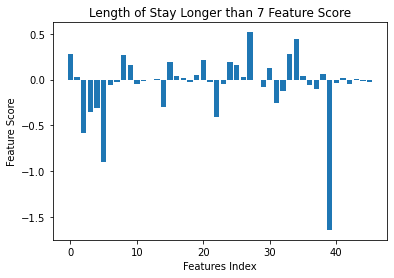

Final results for model LR on target los_3 with representation lvl2
(0.7160376546267381, 0.6633646301187158, 0.6931297709923664, 0.5630434782608695)
Running model LR on target mort_hosp with representation lvl2
New Best Score: 73.71 @ hyperparams = {'C': 0.001383611303681924, 'penalty': 'l2', 'solver': 'liblinear', 'max_iter': 1000}


/Users/kyounhuh/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


New Best Score: 81.40 @ hyperparams = {'C': 1.3047026700306064, 'penalty': 'l2', 'solver': 'lbfgs', 'max_iter': 1000}


/Users/kyounhuh/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


New Best Score: 81.53 @ hyperparams = {'C': 48.783036208459954, 'penalty': 'l2', 'solver': 'lbfgs', 'max_iter': 500}


/Users/kyounhuh/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/kyounhuh/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html

Feature: 0, Score: 0.38715
Feature: 1, Score: 0.02112
Feature: 2, Score: -1.85159
Feature: 3, Score: -1.01206
Feature: 4, Score: -1.02399
Feature: 5, Score: -0.85422
Feature: 6, Score: 0.08930
Feature: 7, Score: 0.28589
Feature: 8, Score: 0.40906
Feature: 9, Score: 0.05459
Feature: 10, Score: -0.14068
Feature: 11, Score: -0.11872
Feature: 12, Score: -0.08673
Feature: 13, Score: -0.02553
Feature: 14, Score: 0.10833
Feature: 15, Score: -0.06140
Feature: 16, Score: 0.08962
Feature: 17, Score: -0.00900
Feature: 18, Score: 0.03147
Feature: 19, Score: 0.20088
Feature: 20, Score: 0.20754
Feature: 21, Score: 0.17069
Feature: 22, Score: -0.46945
Feature: 23, Score: -0.10365
Feature: 24, Score: -0.28983
Feature: 25, Score: 0.77314
Feature: 26, Score: -0.02325
Feature: 27, Score: -0.45906
Feature: 28, Score: 0.03375
Feature: 29, Score: -0.10974
Feature: 30, Score: 0.05284
Feature: 31, Score: -0.18598
Feature: 32, Score: -0.04866
Feature: 33, Score: 0.00983
Feature: 34, Score: 0.14718
Feature: 35,

/Users/kyounhuh/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


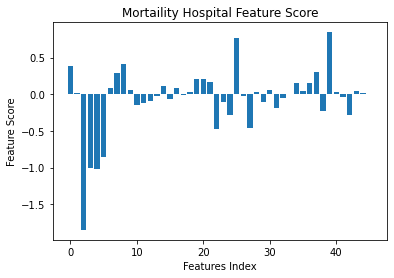

Final results for model LR on target mort_hosp with representation lvl2
(0.8367243143384023, 0.4624356614370281, 0.898473282442748, 0.31088082901554404)
Running model LR on target los_7 with representation lvl2
New Best Score: 69.74 @ hyperparams = {'C': 0.001383611303681924, 'penalty': 'l2', 'solver': 'liblinear', 'max_iter': 1000}


/Users/kyounhuh/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


New Best Score: 77.30 @ hyperparams = {'C': 1.3047026700306064, 'penalty': 'l2', 'solver': 'lbfgs', 'max_iter': 1000}


/Users/kyounhuh/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


New Best Score: 77.32 @ hyperparams = {'C': 0.05459762073728651, 'penalty': 'l2', 'solver': 'lbfgs', 'max_iter': 1000}


/Users/kyounhuh/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


New Best Score: 77.38 @ hyperparams = {'C': 0.3429679403524682, 'penalty': 'l1', 'solver': 'liblinear', 'max_iter': 1000}


/Users/kyounhuh/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/kyounhuh/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html

New Best Score: 77.39 @ hyperparams = {'C': 0.11951096159304532, 'penalty': 'l2', 'solver': 'lbfgs', 'max_iter': 500}


/Users/kyounhuh/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/kyounhuh/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html

Feature: 0, Score: 0.28721
Feature: 1, Score: -0.03668
Feature: 2, Score: -0.45547
Feature: 3, Score: -0.06963
Feature: 4, Score: 0.07166
Feature: 5, Score: -1.14834
Feature: 6, Score: 0.07967
Feature: 7, Score: 0.18215
Feature: 8, Score: 0.07205
Feature: 9, Score: -0.05104
Feature: 10, Score: -0.55331
Feature: 11, Score: 0.29448
Feature: 12, Score: 0.00295
Feature: 13, Score: 0.03996
Feature: 14, Score: 0.00011
Feature: 15, Score: 0.21683
Feature: 16, Score: 0.01816
Feature: 17, Score: -0.00138
Feature: 18, Score: -0.04754
Feature: 19, Score: 0.38402
Feature: 20, Score: 0.17399
Feature: 21, Score: -0.15793
Feature: 22, Score: -0.25871
Feature: 23, Score: -0.40241
Feature: 24, Score: 0.00981
Feature: 25, Score: 0.12982
Feature: 26, Score: 0.05140
Feature: 27, Score: 0.20899
Feature: 28, Score: -0.03610
Feature: 29, Score: 0.31677
Feature: 30, Score: 0.13525
Feature: 31, Score: -0.09379
Feature: 32, Score: 0.02816
Feature: 33, Score: -0.03610
Feature: 34, Score: 0.41404
Feature: 35, Sco

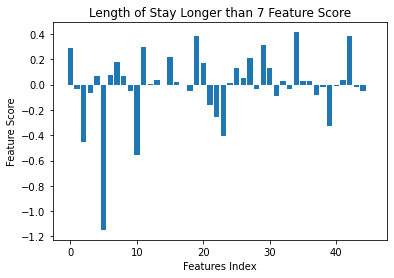

Final results for model LR on target los_7 with representation lvl2
(0.7856830291641999, 0.24818388954518264, 0.9325699745547074, 0.08304498269896193)
CPU times: user 3min, sys: 1.73 s, total: 3min 2s
Wall time: 39.8 s


In [74]:
%%time
for model_name, model, hyperparams_list in [
#     ('RF', RandomForestClassifier, RF_hyperparams_list),
    ('LR', LogisticRegression, LR_hyperparams_list)]:
    if model_name not in results: results[model_name] = {}
    for t in ['mort_icu', 'los_3','mort_hosp', 'los_7']:
        if t not in results[model_name]: results[model_name][t] = {}
        for n, X_flat_train, X_flat_dev, X_flat_test in [
            ('lvl2', X_flat_train, X_flat_dev, X_flat_test)]:
            if n in results[model_name][t]:
                print("Finished model %s on target %s with representation %s" % (model_name, t, n))
                if RERUN: 
                    h = results[model_name][t][n][1]
                    results[model_name][t][n] = run_only_final(model, h, X_flat_train, X_flat_dev, X_flat_test, t)
                    
                    print("Final results for model %s on target %s with representation %s" % (model_name, t, n))
                    print(results[model_name][t][n][2:])

                    with open(RESULTS_PATH, mode='wb') as f: pickle.dump(results, f)
                continue
                
            print("Running model %s on target %s with representation %s" % (model_name, t, n))
            results[model_name][t][n] = run_basic(
                'LR', model, hyperparams_list, X_flat_train, X_flat_dev, X_flat_test, t
            )
            print("Final results for model %s on target %s with representation %s" % (model_name, t, n))
            print(results[model_name][t][n][2:])
            with open(RESULTS_PATH, mode='wb') as f: pickle.dump(results, f)

# Inferecne

In [77]:
RESULTS_PATH = 'RF_model.pkl'
with open(RESULTS_PATH, mode='rb') as f: 
    load_rslt = pickle.load(f)


In [124]:
load_rslt

{'RF': {'mort_icu': {'lvl2': (RandomForestClassifier(max_depth=8, min_samples_leaf=22, min_samples_split=65,
                           n_estimators=122),
    {'n_estimators': 122,
     'max_depth': 8,
     'min_samples_split': 65,
     'min_samples_leaf': 22},
    0.8758875863637997,
    0.475260566948856,
    0.9330788804071247,
    0.27548209366391185)},
  'los_3': {'lvl2': (RandomForestClassifier(max_depth=8, min_samples_leaf=22, min_samples_split=65,
                           n_estimators=122),
    {'n_estimators': 122,
     'max_depth': 8,
     'min_samples_split': 65,
     'min_samples_leaf': 22},
    0.7297587514641577,
    0.6732177896607641,
    0.6824427480916031,
    0.5445255474452555)},
  'mort_hosp': {'lvl2': (RandomForestClassifier(max_depth=8, min_samples_leaf=22, min_samples_split=65,
                           n_estimators=122),
    {'n_estimators': 122,
     'max_depth': 8,
     'min_samples_split': 65,
     'min_samples_leaf': 22},
    0.8403620789234445,
    0.47

In [126]:
model = load_rslt['RF']['mort_icu']['lvl2'][0]
model

RandomForestClassifier(max_depth=8, min_samples_leaf=22, min_samples_split=65,
                       n_estimators=122)

In [107]:
X_flat_test

,readmission_30,gender_F,admission_type_ELECTIVE,admission_type_EMERGENCY,admission_type_URGENT,first_careunit_CSRU,first_careunit_MICU,first_careunit_SICU,"(peak inspiratory pressure, mask, 22)","(glascow coma scale total, mean, 12)",...,"(tidal volume observed, mask, 22)","(tidal volume set, mask, 22)","(anion gap, mean, 22)",oasis_PROB,"(anion gap, mean, 19)","(co2 (etco2, pco2, etc.), time_since_measured, 23)","(plateau pressure, mask, 22)",saps,"(partial pressure of carbon dioxide, time_since_measured, 23)","(ph, time_since_measured, 23)"
icustay_id,,,,,,,,,,,,,,,,,,,,,
293408,0,1,0,1,0,0,1,0,0.0,0.000000,...,0.0,0.0,-0.080207,0.188911,-0.080207,17.0,0.0,26,17.0,17.0
276953,0,0,0,1,0,1,0,0,0.0,-1.647205,...,0.0,0.0,-0.323513,0.087098,-0.323513,4.0,0.0,21,4.0,4.0
253121,0,1,0,1,0,0,1,0,0.0,-0.747533,...,1.0,1.0,-1.053432,0.097783,-1.053432,10.0,1.0,16,10.0,10.0
262841,0,0,0,1,0,0,1,0,0.0,0.000000,...,0.0,0.0,-1.296738,0.170145,-1.296738,48.0,0.0,20,48.0,48.0
287506,0,0,0,1,0,0,1,0,0.0,-1.261631,...,0.0,0.0,-0.323513,0.279468,0.163099,1.0,0.0,24,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
255053,0,1,0,1,0,0,0,1,0.0,0.000000,...,0.0,0.0,0.893018,0.025967,0.893018,4.0,0.0,18,4.0,4.0
278054,0,0,0,1,0,0,0,0,0.0,-0.233434,...,0.0,0.0,-0.323513,0.054187,-0.323513,9.0,0.0,19,9.0,9.0
225879,0,0,1,0,0,1,0,0,0.0,0.794764,...,0.0,0.0,-1.053432,0.188911,-1.053432,32.0,0.0,17,32.0,32.0


In [115]:
X = X_flat_test.loc[[293408]]

In [116]:
X

,readmission_30,gender_F,admission_type_ELECTIVE,admission_type_EMERGENCY,admission_type_URGENT,first_careunit_CSRU,first_careunit_MICU,first_careunit_SICU,"(peak inspiratory pressure, mask, 22)","(glascow coma scale total, mean, 12)",...,"(tidal volume observed, mask, 22)","(tidal volume set, mask, 22)","(anion gap, mean, 22)",oasis_PROB,"(anion gap, mean, 19)","(co2 (etco2, pco2, etc.), time_since_measured, 23)","(plateau pressure, mask, 22)",saps,"(partial pressure of carbon dioxide, time_since_measured, 23)","(ph, time_since_measured, 23)"
icustay_id,,,,,,,,,,,,,,,,,,,,,
293408,0,1,0,1,0,0,1,0,0.0,0.0,...,0.0,0.0,-0.080207,0.188911,-0.080207,17.0,0.0,26,17.0,17.0


In [120]:
y_pred_prob  = model.predict_proba(X)

In [122]:
y_pred  = model.predict(X)

In [121]:
y_pred_prob

array([[0.94965907, 0.05034093]])

In [123]:
y_pred

array([0])

In [ ]:
# result table